# Cleaning items and Predicting: Curry Bread, Yasai Bread, Vegetables & Ham Sandwich

In [320]:
import pandas as pd
import matplotlib.pyplot as plt 
import matplotlib as mpl 
import seaborn as sns
import utils
from scipy.stats import zscore
from scipy import stats
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from fbprophet import Prophet

plt.style.use('fivethirtyeight')

### 2018 - 2020 / January

In [325]:
df18 = pd.read_csv('items-2018_utf8.csv', encoding='UTF-8', sep = '\t')

/usr/local/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning:

Columns (20,21,22) have mixed types.Specify dtype option on import or set low_memory=False.



In [326]:
def cleaning_items(df):
    df=df.copy()
    df = df[['Date', 'Item', 'Qty']]
    df['Date'] = pd.to_datetime(df['Date'])
    df['Qty'] = df['Qty'].astype(int)
    df=df.drop(df[df['Qty'] < 0].index)
    
    X=df[['Date', 'Item', 'Qty']]
    
    
    return X

In [327]:
df18 = cleaning_items(df18)

In [328]:
df19 = pd.read_csv('items-2019-utf8.csv', encoding='UTF-8', sep = '\t')

/usr/local/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning:

Columns (23) have mixed types.Specify dtype option on import or set low_memory=False.



In [329]:
df19 = cleaning_items(df19)

In [330]:
df20 = pd.read_csv('items-2020-utf8.csv', encoding='UTF-8', sep = '\t')

In [331]:
df20 = cleaning_items(df20)

In [332]:
allyears = pd.concat((df18, df19, df20))

In [333]:
allyears.sort_values(by=['Date'], inplace=True, ascending=True)

In [334]:
allyears = allyears.reset_index(drop=True)

In [335]:
split_date='2020-02-01'
allyears= allyears.loc[allyears.Date < split_date].copy()

In [339]:
allyears.head()

,Date,Item,Qty
0,2018-04-26,クロワッサンヌーボー,3
1,2018-04-26,無花果と胡桃のバケット,1
2,2018-04-26,アフォガード,1
3,2018-04-26,季節のタルトケーキ,1
4,2018-04-26,フレンチプレス,1


### Finding all Curry breads over the years

In [278]:
#curry = allyears.groupby(['Date', 'Item']).agg({'Qty':'sum'})

In [340]:
curry = allyears[allyears['Item']=='スイートのカレーパン']

In [341]:
curry = curry.groupby(['Date']).agg({'Qty':'sum'})

In [342]:
curry1 = allyears[allyears['Item']=='カレーパン']

In [343]:
curry1 = curry1.groupby(['Date']).agg({'Qty':'sum'})

In [344]:
allcurry = pd.concat((curry1, curry))
allcurry.sort_values(by=['Date'], inplace=True, ascending=True)


In [345]:
allcurry['Date'] = allcurry.index
allcurry = allcurry.reset_index(drop=True)

In [346]:
allcurry = allcurry[['Date','Qty']]
allcurry

,Date,Qty
0,2018-09-06,13
1,2018-09-07,15
2,2018-09-08,18
3,2018-09-09,18
4,2018-09-10,12
...,...,...
432,2020-01-26,30
433,2020-01-27,22
434,2020-01-28,12
435,2020-01-30,24


### Finding all Yasai(Vegetable & Salami) bread over the years

In [359]:
yasai = allyears[allyears['Item']=='やさいぱん']

In [360]:
yasai = yasai.groupby(['Date']).agg({'Qty':'sum'})

In [361]:
yasai['Date'] = yasai.index
yasai = yasai.reset_index(drop=True)

In [362]:
yasai = yasai[['Date','Qty']]
yasai

,Date,Qty
0,2018-04-26,16
1,2018-04-27,20
2,2018-04-28,35
3,2018-04-29,37
4,2018-04-30,21
...,...,...
550,2020-01-26,30
551,2020-01-27,22
552,2020-01-28,10
553,2020-01-30,30


### Finding all Yasai(Vegetable & Salami) bread over the years

In [363]:
sando = allyears[allyears['Item']=='たっぷり野菜サンド']

In [364]:
sando = sando.groupby(['Date']).agg({'Qty':'sum'})

In [365]:
sando['Date'] = sando.index
sando = sando.reset_index(drop=True)

In [366]:
sando = sando[['Date','Qty']]
sando

,Date,Qty
0,2018-04-26,9
1,2018-04-27,10
2,2018-04-28,8
3,2018-04-29,11
4,2018-04-30,12
...,...,...
549,2020-01-26,6
550,2020-01-27,6
551,2020-01-28,1
552,2020-01-30,2


# Predicting Curry Bread using  x.test as measure

In [286]:
train= allcurry

In [287]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 437 entries, 0 to 436
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    437 non-null    datetime64[ns]
 1   Qty     437 non-null    int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 7.0 KB


In [295]:
train.rename(columns={'Date': 'ds', 'Qty': 'y'}, inplace=True)
df = train

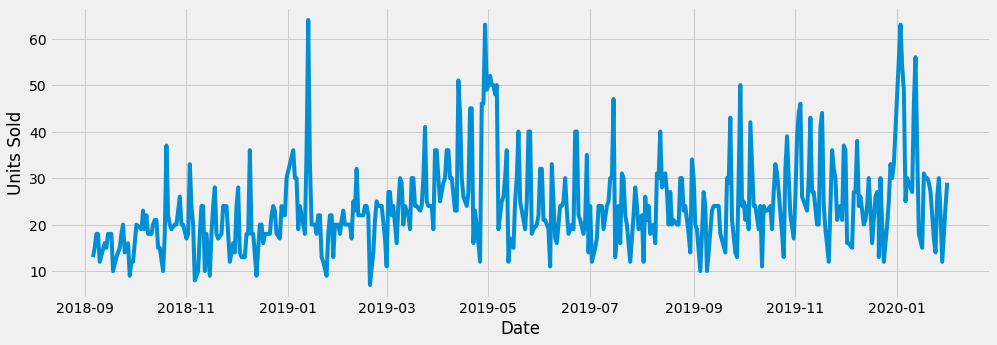

In [297]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(df['ds'], df['y'], linestyle='-', label='All data')
ax.set_xlabel('Date')
ax.set_ylabel('Units Sold');


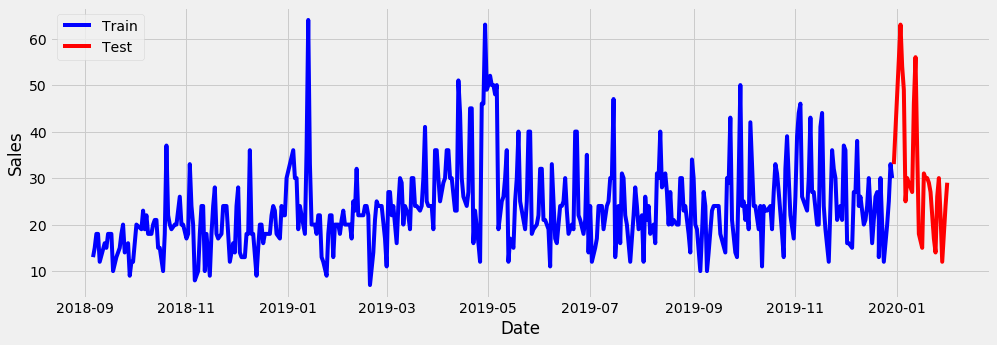

In [298]:
n_test = 26
df_train = df[:-n_test]
df_test = df[-n_test:]
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(df_train['ds'], df_train['y'], linestyle='-', color='blue', label='Train')
ax.plot(df_test['ds'],df_test['y'],linestyle='-', color='red', label='Test')
ax.legend()
ax.set_xlabel('Date')
ax.set_ylabel('Sales');

In [299]:
events = pd.DataFrame({
    'holiday': 'event',
    'ds': pd.to_datetime(['2018-04-28', '2018-04-29', '2018-04-30', 
                          '2018-05-03', '2018-05-04', '2018-05-05',
                          '2018-05-20', '2018-05-26', '2018-05-27',
                          '2018-06-23', '2018-06-24', '2018-07-29',
                          '2018-08-04', '2018-08-11', '2018-08-12', 
                          '2018-08-14', '2018-08-16', '2018-08-19',
                          '2018-09-02', '2018-09-23', '2018-09-24',
                          '2018-10-08', '2018-11-03', 
                          '2019-01-02', '2019-01-03', '2019-01-04',
                          '2019-01-05', '2019-01-06', '2019-01-12', 
                          '2019-01-13', '2019-04-13', '2019-04-14',
                          '2019-04-20', '2019-04-21', '2019-04-28',
                          '2019-04-29', '2019-04-30', '2019-05-01',
                          '2019-05-02', '2019-05-03', '2019-05-04', 
                          '2019-05-25', '2019-05-26', '2019-06-22',
                          '2019-06-23', '2019-07-14', '2019-08-11',
                          '2019-08-12', '2019-08-15', '2019-09-29', 
                          '2019-11-03',
                          '2020-01-02', '2020-01-03', '2020-01-04',
                          '2020-01-05', '2020-01-11', '2020-01-12',
                          '2020-01-13', '2020-02-02', '2020-02-14',
                          '2020-02-23']),
    'lower_window':0,
    'upper_window':1,
})
superholidays = pd.DataFrame({
    'holiday': 'superholiday',
    'ds': pd.to_datetime(['2018-04-29', '2018-05-03', '2018-05-04',
                          '2018-05-05', '2018-05-27', '2018-06-23', 
                          '2018-06-24', '2018-08-04',
                          '2019-01-02', '2019-01-03', '2019-01-13',
                          '2019-04-29', '2019-04-30', '2019-05-01',
                          '2019-05-03', '2019-05-04', '2019-06-22',
                          '2020-01-02', '2020-01-03', '2020-01-04',
                          '2020-01-11']),
    'lower_window':0,
   'upper_window':1,
})
holidays = pd.concat((events, superholidays))


In [300]:
#Hyperparameters
model = Prophet(holidays=holidays, 
            
            yearly_seasonality=True, 
            weekly_seasonality=True, 
            daily_seasonality=False,
            
            seasonality_prior_scale=0.1,
            interval_width=0.95,
            holidays_prior_scale=10,
            changepoint_prior_scale=0.15)
                                    
model.add_country_holidays(country_name='JP')
model.fit(df_train)

In [301]:
forecast = model.predict(df)
forecast[['ds','yhat']].head()

,ds,yhat
0,2018-09-06,9.506477
1,2018-09-07,10.399162
2,2018-09-08,17.889609
3,2018-09-09,18.896697
4,2018-09-10,11.683465


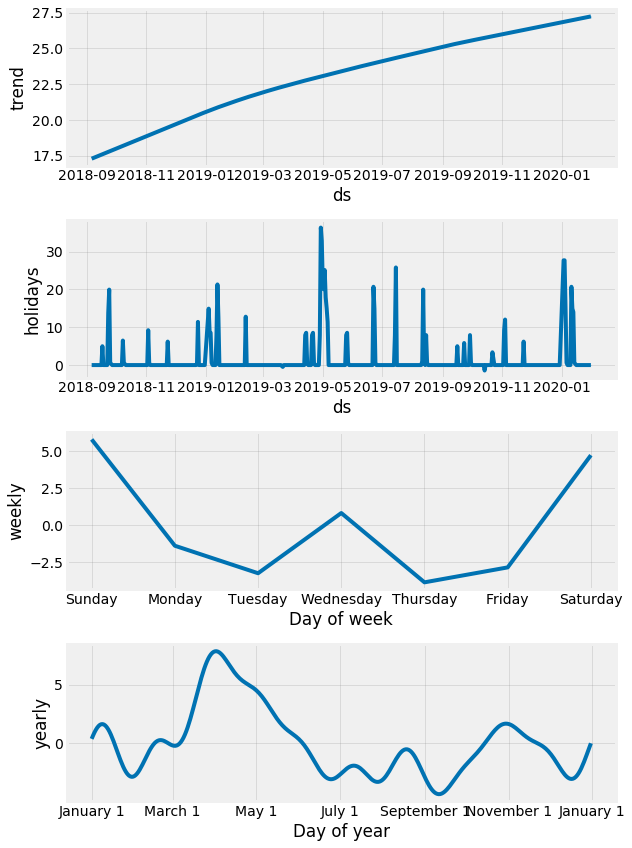

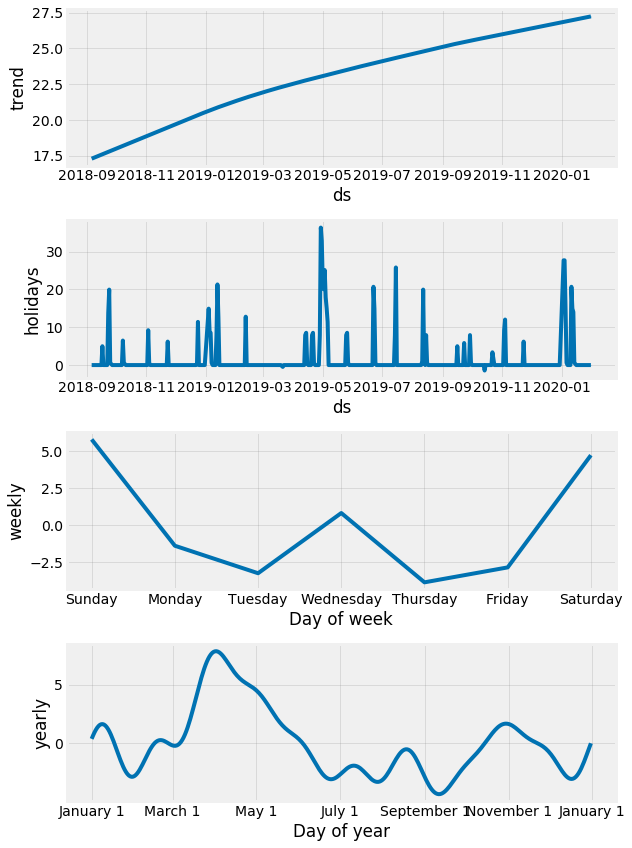

In [302]:
model.plot_components(forecast)

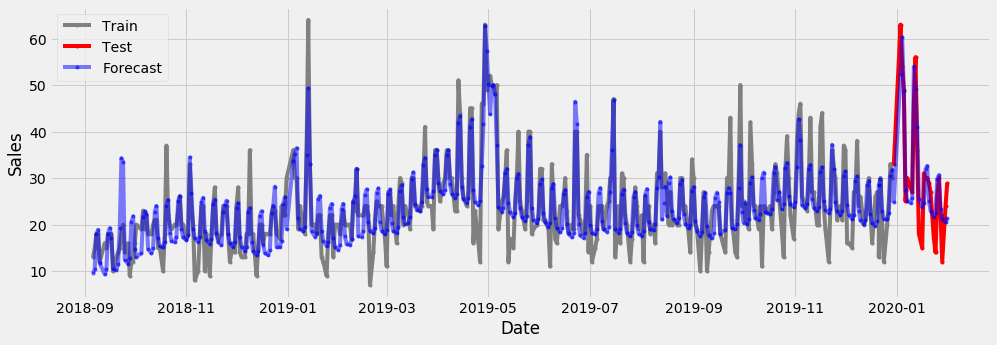

In [303]:
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(df_train['ds'], df_train['y'], c='grey', marker='o', ms=3, linestyle='-', label='Train')
ax.plot(df_test['ds'], df_test['y'], c='red', marker='o',ms=3, linestyle='-', label='Test')
ax.plot(forecast['ds'], forecast['yhat'], c='blue', marker='o', ms=3, linestyle='-', label='Forecast', alpha=0.5)
ax.legend()
ax.set_xlabel('Date')
ax.set_ylabel('Sales');

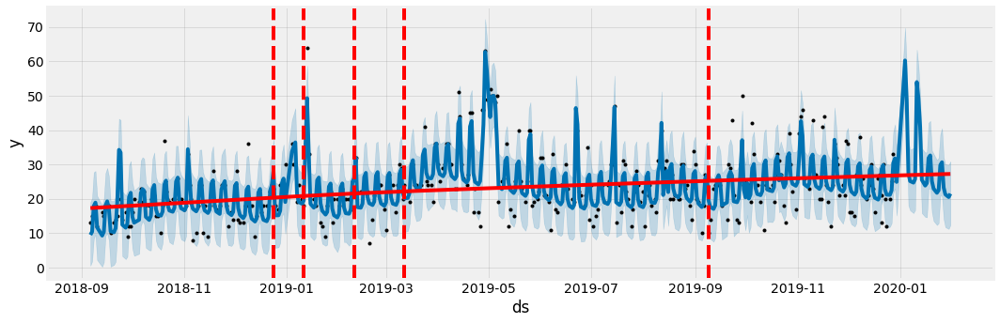

In [308]:
from fbprophet.plot import add_changepoints_to_plot
fig = model.plot(forecast,figsize=(15, 5))
a = add_changepoints_to_plot(fig.gca(), model, forecast)

In [306]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model,forecast)
py.iplot(fig)

### Metrics 

In [309]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
432,2020-01-26,30.646839,20.784311,40.541088
433,2020-01-27,23.280387,14.113839,32.051366
434,2020-01-28,21.279105,11.739470,30.003418
435,2020-01-30,20.503249,11.223956,29.890018
436,2020-01-31,21.497206,12.351430,30.893297


In [310]:
metric_df = forecast.set_index('ds')[['yhat']].join(df.set_index('ds').y).reset_index()

In [311]:
metric_df.tail(5)

,ds,yhat,y
434,2020-01-26,30.646839,30
435,2020-01-27,23.280387,22
436,2020-01-28,21.279105,12
437,2020-01-30,20.503249,24
438,2020-01-31,21.497206,29


In [312]:
metric_df.dropna(inplace=True)

In [313]:
metric_df.tail()

,ds,yhat,y
434,2020-01-26,30.646839,30
435,2020-01-27,23.280387,22
436,2020-01-28,21.279105,12
437,2020-01-30,20.503249,24
438,2020-01-31,21.497206,29


In [321]:
r2_score(metric_df.y, metric_df.yhat)

0.7267487959987367

In [315]:
mean_squared_error(metric_df.y, metric_df.yhat)**0.5

4.913976523150092

In [316]:
mean_absolute_error(metric_df.y, metric_df.yhat)

3.64103359728147

In [319]:
metric_df.loc['2020':,['y','yhat']].corr()

,y,yhat
y,1.000000,0.820915
yhat,0.820915,1.000000


# Predicting Yasai (Vegetables & Salami) Bread using  x.test as measure

In [368]:
train= yasai

In [369]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555 entries, 0 to 554
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    555 non-null    datetime64[ns]
 1   Qty     555 non-null    int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 8.8 KB


In [370]:
train.rename(columns={'Date': 'ds', 'Qty': 'y'}, inplace=True)
df = train

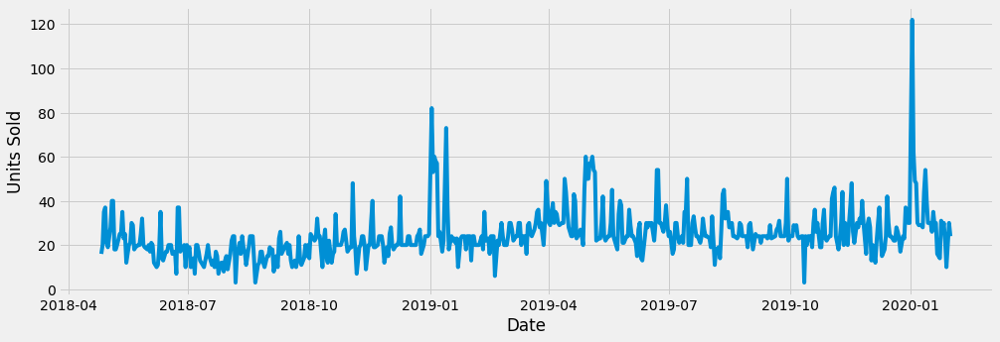

In [371]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(df['ds'], df['y'], linestyle='-', label='All data')
ax.set_xlabel('Date')
ax.set_ylabel('Units Sold');


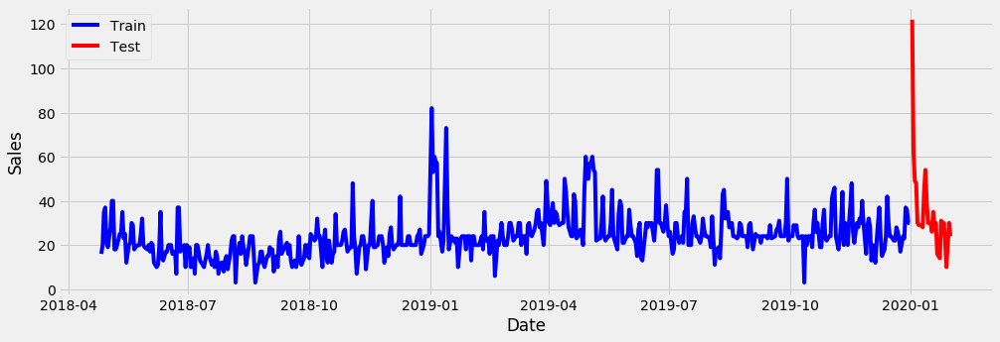

In [372]:
n_test = 26
df_train = df[:-n_test]
df_test = df[-n_test:]
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(df_train['ds'], df_train['y'], linestyle='-', color='blue', label='Train')
ax.plot(df_test['ds'],df_test['y'],linestyle='-', color='red', label='Test')
ax.legend()
ax.set_xlabel('Date')
ax.set_ylabel('Sales');

In [373]:
events = pd.DataFrame({
    'holiday': 'event',
    'ds': pd.to_datetime(['2018-04-28', '2018-04-29', '2018-04-30', 
                          '2018-05-03', '2018-05-04', '2018-05-05',
                          '2018-05-20', '2018-05-26', '2018-05-27',
                          '2018-06-23', '2018-06-24', '2018-07-29',
                          '2018-08-04', '2018-08-11', '2018-08-12', 
                          '2018-08-14', '2018-08-16', '2018-08-19',
                          '2018-09-02', '2018-09-23', '2018-09-24',
                          '2018-10-08', '2018-11-03', 
                          '2019-01-02', '2019-01-03', '2019-01-04',
                          '2019-01-05', '2019-01-06', '2019-01-12', 
                          '2019-01-13', '2019-04-13', '2019-04-14',
                          '2019-04-20', '2019-04-21', '2019-04-28',
                          '2019-04-29', '2019-04-30', '2019-05-01',
                          '2019-05-02', '2019-05-03', '2019-05-04', 
                          '2019-05-25', '2019-05-26', '2019-06-22',
                          '2019-06-23', '2019-07-14', '2019-08-11',
                          '2019-08-12', '2019-08-15', '2019-09-29', 
                          '2019-11-03',
                          '2020-01-02', '2020-01-03', '2020-01-04',
                          '2020-01-05', '2020-01-11', '2020-01-12',
                          '2020-01-13', '2020-02-02', '2020-02-14',
                          '2020-02-23']),
    'lower_window':0,
    'upper_window':1,
})
superholidays = pd.DataFrame({
    'holiday': 'superholiday',
    'ds': pd.to_datetime(['2018-04-29', '2018-05-03', '2018-05-04',
                          '2018-05-05', '2018-05-27', '2018-06-23', 
                          '2018-06-24', '2018-08-04',
                          '2019-01-02', '2019-01-03', '2019-01-13',
                          '2019-04-29', '2019-04-30', '2019-05-01',
                          '2019-05-03', '2019-05-04', '2019-06-22',
                          '2020-01-02', '2020-01-03', '2020-01-04',
                          '2020-01-11']),
    'lower_window':0,
   'upper_window':1,
})
holidays = pd.concat((events, superholidays))


In [393]:
#Hyperparameters
model = Prophet(holidays=holidays, 
            
            yearly_seasonality=True, 
            weekly_seasonality=True, 
            daily_seasonality=True,
            
            seasonality_prior_scale=0.1,
            interval_width=0.95,
            holidays_prior_scale=10,
            changepoint_prior_scale=0.15)
                                    
model.add_country_holidays(country_name='JP')
model.fit(df_train)

In [397]:
forecast = model.predict(df)
forecast[['ds','yhat']].head()

,ds,yhat
0,2018-04-26,13.990549
1,2018-04-27,15.250446
2,2018-04-28,29.096802
3,2018-04-29,46.422111
4,2018-04-30,34.625764


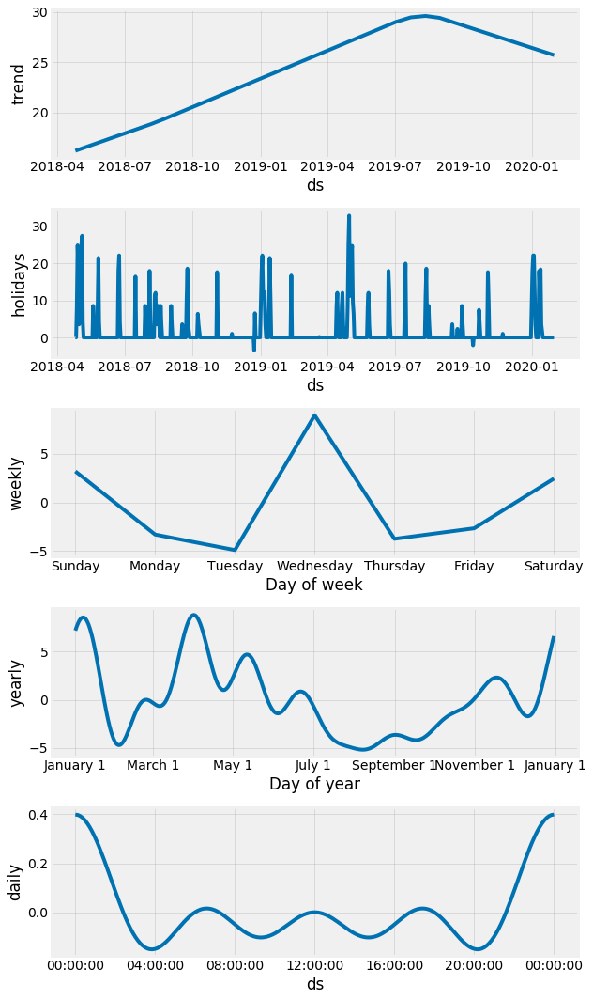

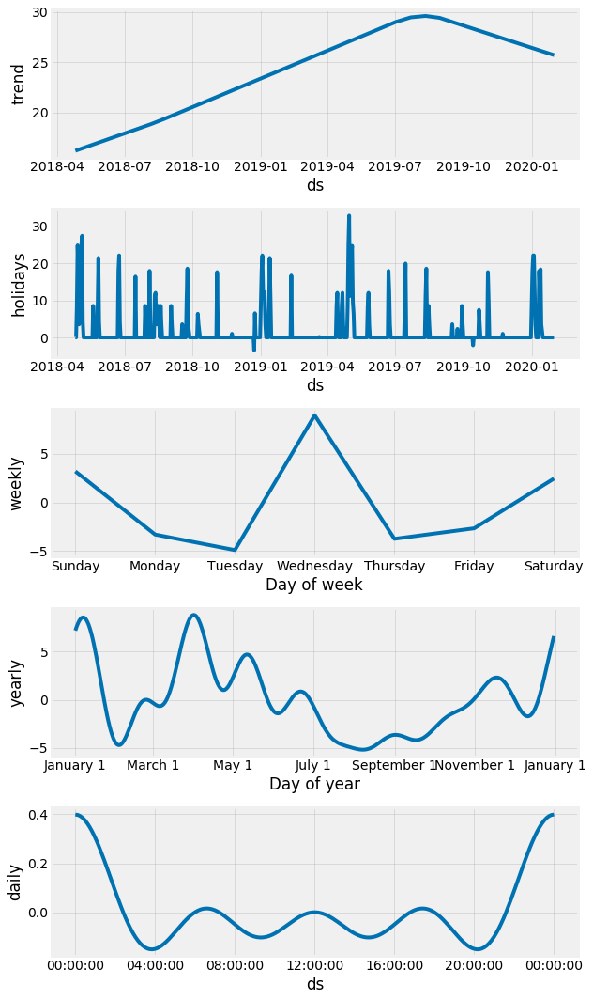

In [398]:
model.plot_components(forecast)

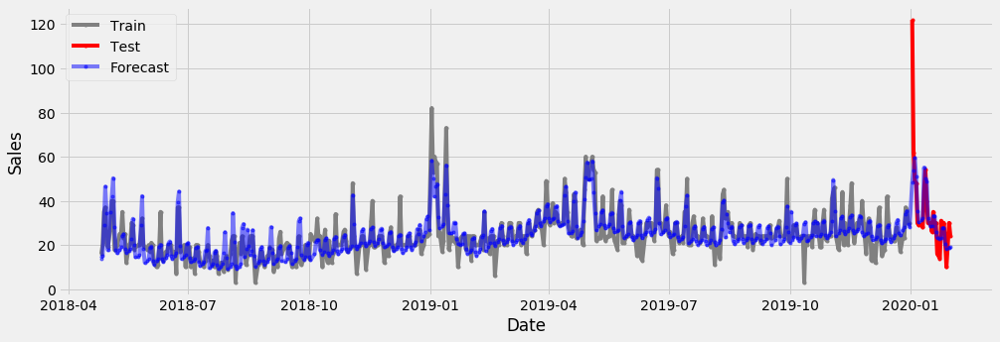

In [399]:
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(df_train['ds'], df_train['y'], c='grey', marker='o', ms=3, linestyle='-', label='Train')
ax.plot(df_test['ds'], df_test['y'], c='red', marker='o',ms=3, linestyle='-', label='Test')
ax.plot(forecast['ds'], forecast['yhat'], c='blue', marker='o', ms=3, linestyle='-', label='Forecast', alpha=0.5)
ax.legend()
ax.set_xlabel('Date')
ax.set_ylabel('Sales');

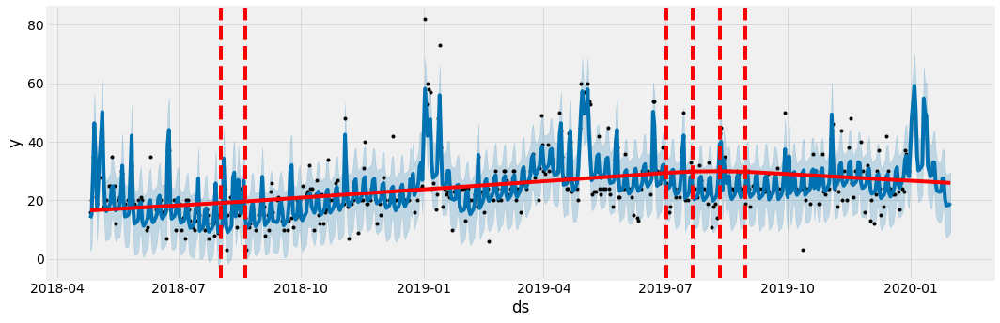

In [378]:
from fbprophet.plot import add_changepoints_to_plot
fig = model.plot(forecast,figsize=(15, 5))
a = add_changepoints_to_plot(fig.gca(), model, forecast)

In [379]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model,forecast)
py.iplot(fig)

### Metrics 

In [380]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
550,2020-01-26,27.562991,16.883762,37.154555
551,2020-01-27,20.433718,8.976269,30.285243
552,2020-01-28,18.252917,7.245466,28.716464
553,2020-01-30,18.444480,8.289159,29.239818
554,2020-01-31,19.158185,9.128949,29.788604


In [381]:
metric_df = forecast.set_index('ds')[['yhat']].join(df.set_index('ds').y).reset_index()

In [382]:
metric_df.tail(5)

,ds,yhat,y
550,2020-01-26,27.562991,30
551,2020-01-27,20.433718,22
552,2020-01-28,18.252917,10
553,2020-01-30,18.444480,30
554,2020-01-31,19.158185,24


In [383]:
metric_df.dropna(inplace=True)

In [384]:
metric_df.tail()

,ds,yhat,y
550,2020-01-26,27.562991,30
551,2020-01-27,20.433718,22
552,2020-01-28,18.252917,10
553,2020-01-30,18.444480,30
554,2020-01-31,19.158185,24


In [385]:
r2_score(metric_df.y, metric_df.yhat)

0.673992340336725

In [386]:
mean_squared_error(metric_df.y, metric_df.yhat)**0.5

6.3031662647037745

In [387]:
mean_absolute_error(metric_df.y, metric_df.yhat)

4.181100514660764

In [388]:
metric_df.loc['2020':,['y','yhat']].corr()

,y,yhat
y,1.00000,0.81457
yhat,0.81457,1.00000


# Predicting Vegestables & Ham Sandwich using  x.test as measure

In [400]:
train= sando

In [401]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 554 entries, 0 to 553
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    554 non-null    datetime64[ns]
 1   Qty     554 non-null    int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 8.8 KB


In [402]:
train.rename(columns={'Date': 'ds', 'Qty': 'y'}, inplace=True)
df = train

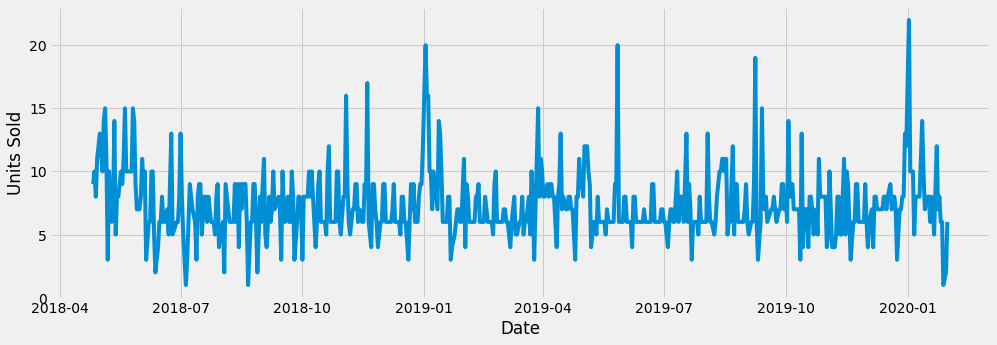

In [403]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(df['ds'], df['y'], linestyle='-', label='All data')
ax.set_xlabel('Date')
ax.set_ylabel('Units Sold');


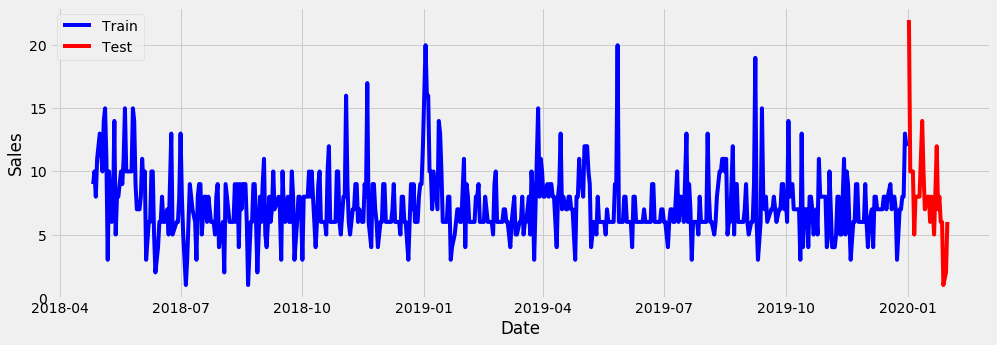

In [404]:
n_test = 26
df_train = df[:-n_test]
df_test = df[-n_test:]
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(df_train['ds'], df_train['y'], linestyle='-', color='blue', label='Train')
ax.plot(df_test['ds'],df_test['y'],linestyle='-', color='red', label='Test')
ax.legend()
ax.set_xlabel('Date')
ax.set_ylabel('Sales');

In [405]:
events = pd.DataFrame({
    'holiday': 'event',
    'ds': pd.to_datetime(['2018-04-28', '2018-04-29', '2018-04-30', 
                          '2018-05-03', '2018-05-04', '2018-05-05',
                          '2018-05-20', '2018-05-26', '2018-05-27',
                          '2018-06-23', '2018-06-24', '2018-07-29',
                          '2018-08-04', '2018-08-11', '2018-08-12', 
                          '2018-08-14', '2018-08-16', '2018-08-19',
                          '2018-09-02', '2018-09-23', '2018-09-24',
                          '2018-10-08', '2018-11-03', 
                          '2019-01-02', '2019-01-03', '2019-01-04',
                          '2019-01-05', '2019-01-06', '2019-01-12', 
                          '2019-01-13', '2019-04-13', '2019-04-14',
                          '2019-04-20', '2019-04-21', '2019-04-28',
                          '2019-04-29', '2019-04-30', '2019-05-01',
                          '2019-05-02', '2019-05-03', '2019-05-04', 
                          '2019-05-25', '2019-05-26', '2019-06-22',
                          '2019-06-23', '2019-07-14', '2019-08-11',
                          '2019-08-12', '2019-08-15', '2019-09-29', 
                          '2019-11-03',
                          '2020-01-02', '2020-01-03', '2020-01-04',
                          '2020-01-05', '2020-01-11', '2020-01-12',
                          '2020-01-13', '2020-02-02', '2020-02-14',
                          '2020-02-23']),
    'lower_window':0,
    'upper_window':1,
})
superholidays = pd.DataFrame({
    'holiday': 'superholiday',
    'ds': pd.to_datetime(['2018-04-29', '2018-05-03', '2018-05-04',
                          '2018-05-05', '2018-05-27', '2018-06-23', 
                          '2018-06-24', '2018-08-04',
                          '2019-01-02', '2019-01-03', '2019-01-13',
                          '2019-04-29', '2019-04-30', '2019-05-01',
                          '2019-05-03', '2019-05-04', '2019-06-22',
                          '2020-01-02', '2020-01-03', '2020-01-04',
                          '2020-01-11']),
    'lower_window':0,
   'upper_window':1,
})
holidays = pd.concat((events, superholidays))


In [406]:
#Hyperparameters
model = Prophet(holidays=holidays, 
            
            yearly_seasonality=True, 
            weekly_seasonality=True, 
            daily_seasonality=True,
            
            seasonality_prior_scale=0.1,
            interval_width=0.95,
            holidays_prior_scale=10,
            changepoint_prior_scale=0.15)
                                    
model.add_country_holidays(country_name='JP')
model.fit(df_train)

In [407]:
forecast = model.predict(df)
forecast[['ds','yhat']].head()

,ds,yhat
0,2018-04-26,7.909371
1,2018-04-27,7.431264
2,2018-04-28,10.353771
3,2018-04-29,11.740364
4,2018-04-30,11.651986


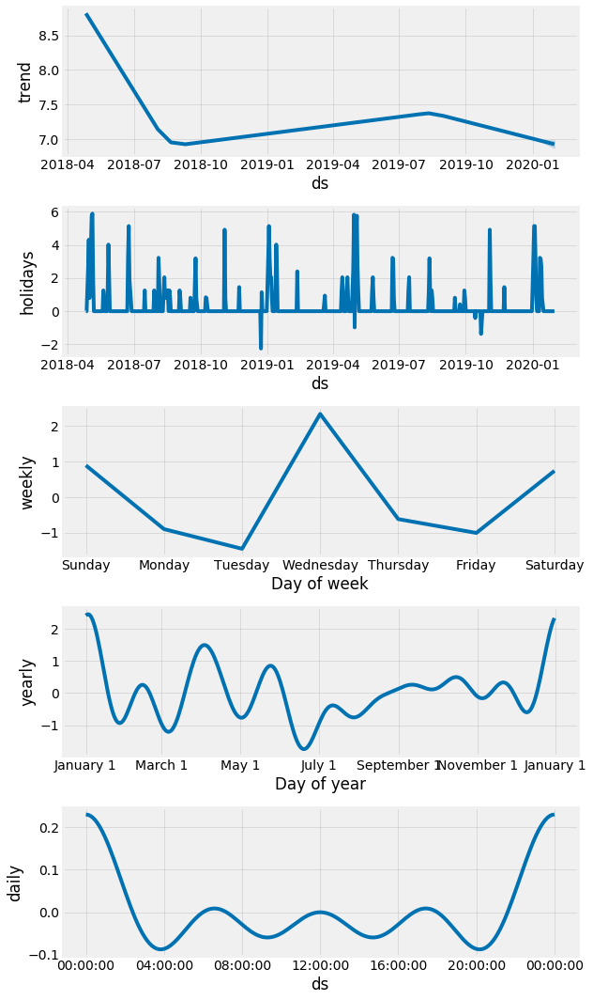

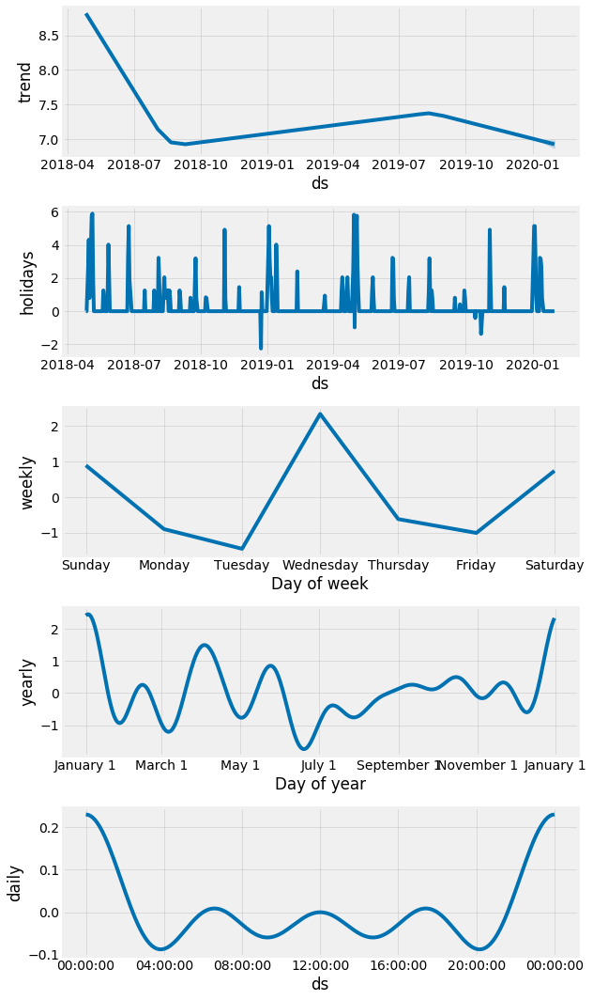

In [408]:
model.plot_components(forecast)

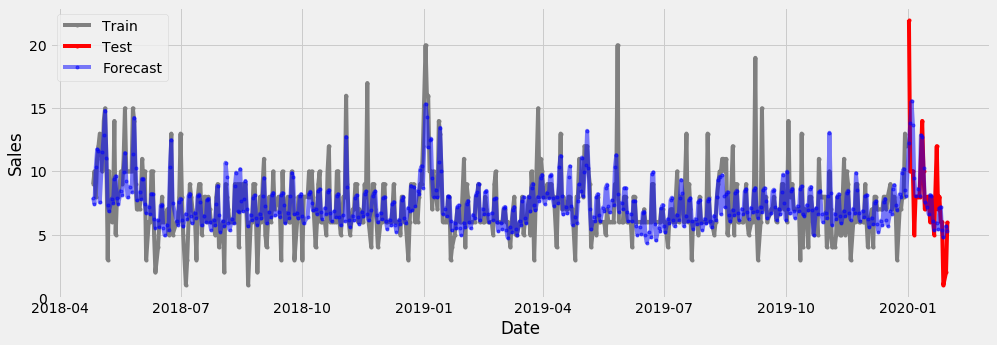

In [409]:
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(df_train['ds'], df_train['y'], c='grey', marker='o', ms=3, linestyle='-', label='Train')
ax.plot(df_test['ds'], df_test['y'], c='red', marker='o',ms=3, linestyle='-', label='Test')
ax.plot(forecast['ds'], forecast['yhat'], c='blue', marker='o', ms=3, linestyle='-', label='Forecast', alpha=0.5)
ax.legend()
ax.set_xlabel('Date')
ax.set_ylabel('Sales');

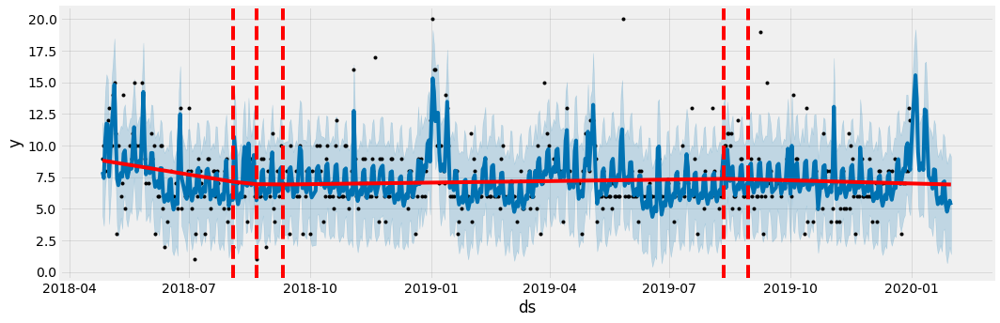

In [410]:
from fbprophet.plot import add_changepoints_to_plot
fig = model.plot(forecast,figsize=(15, 5))
a = add_changepoints_to_plot(fig.gca(), model, forecast)

In [411]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model,forecast)
py.iplot(fig)

### Metrics 

In [412]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
549,2020-01-26,7.173136,3.430785,10.698705
550,2020-01-27,5.342223,1.453405,9.264399
551,2020-01-28,4.773329,0.706892,8.565061
552,2020-01-30,5.646657,2.006297,9.418694
553,2020-01-31,5.306015,1.416667,9.140810


In [413]:
metric_df = forecast.set_index('ds')[['yhat']].join(df.set_index('ds').y).reset_index()

In [414]:
metric_df.tail(5)

,ds,yhat,y
549,2020-01-26,7.173136,6
550,2020-01-27,5.342223,6
551,2020-01-28,4.773329,1
552,2020-01-30,5.646657,2
553,2020-01-31,5.306015,6


In [415]:
metric_df.dropna(inplace=True)

In [416]:
metric_df.tail()

,ds,yhat,y
549,2020-01-26,7.173136,6
550,2020-01-27,5.342223,6
551,2020-01-28,4.773329,1
552,2020-01-30,5.646657,2
553,2020-01-31,5.306015,6


In [417]:
r2_score(metric_df.y, metric_df.yhat)

0.4246612874369977

In [418]:
mean_squared_error(metric_df.y, metric_df.yhat)**0.5

2.0244109017903424

In [419]:
mean_absolute_error(metric_df.y, metric_df.yhat)

1.3453749738172802

In [420]:
metric_df.loc['2020':,['y','yhat']].corr()

,y,yhat
y,1.00000,0.62466
yhat,0.62466,1.00000
